In [2]:
%pwd

'C:\\Users\\User\\Desktop\\Pice\\Work\\ConnectedTech\\UTAC_OCR\\TrOCR'

# Images

In [88]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

from glob import glob
import os
import shutil
from copy import deepcopy
from tqdm.notebook import tqdm
from PIL import Image

In [89]:
work_dir = os.getcwd()
test_image_dir = os.path.join(work_dir, "test_images")

def get_fake_real_image_paths(exp_name, resize_type, iter_name):
    # exp_name = "industrial_exp1"
    # resize_type = "resize_2000_1024"
    # iter_name = "test_latest_iter10"
    image_dir = os.path.join(test_image_dir, exp_name, resize_type, iter_name, "images")
    images_fake = sorted(glob(os.path.join(image_dir, "*fake*")))
    images_real = sorted(glob(os.path.join(image_dir, "*real*")))
    return images_fake, images_real

In [32]:
# example
images_fake, images_real = get_fake_real_image_paths(exp_name="industrial_exp1", 
                                                     resize_type="resize_2000_1024", 
                                                     iter_name="test_latest_iter10")

# TrOCR

In [90]:
import matplotlib.pyplot as plt
import cv2

In [91]:
from PIL import Image
import torch
from transformers import TrOCRProcessor
from transformers import VisionEncoderDecoderModel

In [92]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

In [93]:
processor = TrOCRProcessor.from_pretrained("microsoft/trocr-large-printed")
model = VisionEncoderDecoderModel.from_pretrained("microsoft/trocr-large-printed")
model.to(device)

Could not find image processor class in the image processor config or the model config. Loading based on pattern matching with the model's feature extractor configuration. Please open a PR/issue to update `preprocessor_config.json` to use `image_processor_type` instead of `feature_extractor_type`. This warning will be removed in v4.40.
Some weights of VisionEncoderDecoderModel were not initialized from the model checkpoint at microsoft/trocr-large-printed and are newly initialized: ['encoder.pooler.dense.bias', 'encoder.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


VisionEncoderDecoderModel(
  (encoder): ViTModel(
    (embeddings): ViTEmbeddings(
      (patch_embeddings): ViTPatchEmbeddings(
        (projection): Conv2d(3, 1024, kernel_size=(16, 16), stride=(16, 16))
      )
      (dropout): Dropout(p=0.0, inplace=False)
    )
    (encoder): ViTEncoder(
      (layer): ModuleList(
        (0-23): 24 x ViTLayer(
          (attention): ViTAttention(
            (attention): ViTSelfAttention(
              (query): Linear(in_features=1024, out_features=1024, bias=False)
              (key): Linear(in_features=1024, out_features=1024, bias=False)
              (value): Linear(in_features=1024, out_features=1024, bias=False)
              (dropout): Dropout(p=0.0, inplace=False)
            )
            (output): ViTSelfOutput(
              (dense): Linear(in_features=1024, out_features=1024, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
            )
          )
          (intermediate): ViTIntermediate(
            (dense): Line

In [94]:
def trocr_inference(image_path):
    image = Image.open(image_path).convert("RGB")
    pixel_values = processor(image, return_tensors="pt").pixel_values
    pixel_values = pixel_values.to(device)  # dont forgwet to model.to(device) !!
    generated_ids = model.generate(pixel_values)
    generated_text = processor.batch_decode(generated_ids, skip_special_tokens=True)[0]
    return generated_text

In [87]:
%%time
trocr_inference("./test_images/industrial_exp1/resize_2000_1024/test_latest_iter10/images/-4H02_hard_fake.png")

CPU times: total: 484 ms
Wall time: 241 ms


'ITEM'

In [84]:
def trocr_inference(image):
    pixel_values = processor(images=image, return_tensors="pt").pixel_values
    pixel_values = pixel_values.to(device)  # !!
    generated_ids = model.generate(pixel_values)
    generated_text = processor.batch_decode(generated_ids, skip_special_tokens=True)[0]
    return generated_text
    
# rgb
image = cv2.imread("./test_images/industrial_exp1/resize_2000_1024/test_latest_iter10/images/9A067_1_normal_real.png")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image = Image.fromarray(image, mode='RGB')
print(trocr_inference(image))

# gray scale
image = cv2.imread("./test_images/industrial_exp1/resize_2000_1024/test_latest_iter10/images/9A067_1_normal_real.png")
image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
image = np.stack((image, image, image), axis=-1)
image = Image.fromarray(image, mode='RGB')
print(trocr_inference(image))

9AUG 7
9AUG 7


# Experiment Result Collection - Accuracy

### Baseline

In [98]:
imgs = sorted(glob("./test_images/2401UTAC_jpg_cropped/*"))

original_dict = {"image_path":[], "true_text":[], "predicted_text":[]}
original_normal_dict = {"image_path":[], "true_text":[], "predicted_text":[]}
original_hard_dict = {"image_path":[], "true_text":[], "predicted_text":[]}
original_extreme_dict = {"image_path":[], "true_text":[], "predicted_text":[]}
original_unreadable_dict = {"image_path":[], "true_text":[], "predicted_text":[]}

for image_path in tqdm(imgs):
    gt_text, extreme_level, _ = get_label_info(image_path, keep_ambiguous=True)
    pred_text = trocr_inference(image_path)
    # all
    original_dict["image_path"].append(image_path)
    original_dict["true_text"].append(gt_text)
    original_dict["predicted_text"].append(pred_text)
    # normal
    if extreme_level == 'normal':
        original_normal_dict["image_path"].append(image_path)
        original_normal_dict["true_text"].append(gt_text)
        original_normal_dict["predicted_text"].append(pred_text)
    elif extreme_level == 'hard':
        original_hard_dict["image_path"].append(image_path)
        original_hard_dict["true_text"].append(gt_text)
        original_hard_dict["predicted_text"].append(pred_text)
    elif extreme_level == 'extreme':
        original_extreme_dict["image_path"].append(image_path)
        original_extreme_dict["true_text"].append(gt_text)
        original_extreme_dict["predicted_text"].append(pred_text)
    elif extreme_level == 'unreadable':
        original_unreadable_dict["image_path"].append(image_path)
        original_unreadable_dict["true_text"].append(gt_text)
        original_unreadable_dict["predicted_text"].append(pred_text)
        
acc_all = character_accuracy(pred_texts=original_dict['predicted_text'], true_texts=original_dict['true_text'])
acc_normal = character_accuracy(pred_texts=original_normal_dict['predicted_text'], true_texts=original_normal_dict['true_text'])
acc_hard = character_accuracy(pred_texts=original_hard_dict['predicted_text'], true_texts=original_hard_dict['true_text'])
acc_extreme = character_accuracy(pred_texts=original_extreme_dict['predicted_text'], true_texts=original_extreme_dict['true_text'])
acc_unreadable = character_accuracy(pred_texts=original_unreadable_dict['predicted_text'], true_texts=original_unreadable_dict['true_text'])
print(f"Experiment Detail >>> Original images")
print(f"Character Accuracy [All]: {acc_all}")
print(f"Character Accuracy [Normal]: {acc_normal}")
print(f"Character Accuracy [Hard]: {acc_hard}")
print(f"Character Accuracy [Extreme]: {acc_extreme}")
print(f"Character Accuracy [Unreadable]: {acc_unreadable}")

  0%|          | 0/160 [00:00<?, ?it/s]

Experiment Detail >>> Original images
Character Accuracy [All]: 0.17429837518463812
Character Accuracy [Normal]: 0.3991031390134529
Character Accuracy [Hard]: 0.09642857142857143
Character Accuracy [Extreme]: 0.006896551724137931
Character Accuracy [Unreadable]: 0.0


### Ours

In [11]:
name = os.path.basename(images_fake[0])
name = name.replace("_fake", "")
name = os.path.splitext(name)[0]
name

NameError: name 'images_fake' is not defined

In [99]:
def get_label_info(image_path, keep_ambiguous=True): # For a single image
    """
    function to get label from image_path according to my specific naming method
    this is not the same as my colab notebook, cause name now contains "_fake"
    """
    name = os.path.basename(image_path)
    name = os.path.splitext(name)[0]
    name = name.replace("_fake", "") # !!!!!!! Add this line

    label, extreme_level, extra_info = '', '', ''

    # get label information
    if len(name.split("_")) == 2:
        label = name.split("_")[0]
        extreme_level = name.split("_")[1]
    elif len(name.split("_")) == 3:
        label = name.split("_")[0]
        extreme_level = name.split("_")[2]
    elif len(name.split("_")) == 4:
        label = name.split("_")[0]
        extreme_level = name.split("_")[2]
        extra_info = name.split("_")[3] # blur
    else:
        print("! Not in our format !")

    # for the image that I'm not sure the exact text label (specified by having parenthesis)
    if keep_ambiguous == True:
        # try yo fix text label based on the closest number that I can observe
        if len(label) != 0:
            # to check it has some unclear character
            if "(" in label:
                start_index = label.index("(")
                end_index = label.index(")")
                if label[start_index+1] == '3': # I want to change (3)8Z003 to 3Z003 (image are cropped badly)
                    label = "3" + label[4:]
                else: # 8Z03(7), just this image, I want to remove "7"
                    label = label[:start_index] + label[end_index+1:]
        else:
            print("Error: Can't get text label information")
    else:
        # to remove the unclear image
        if len(label) != 0:
            if "(" in label:
                return "remove"

    return label, extreme_level, extra_info


def character_accuracy(pred_texts, true_texts):
    total_correct_chars = 0
    total_chars = 0
    for pred_text, true_text in zip(pred_texts, true_texts):
        for pred_char, true_char in zip(pred_text, true_text):
            if pred_char == true_char:
                total_correct_chars += 1
            total_chars += 1
    return total_correct_chars / total_chars if total_chars != 0 else 0

In [100]:
def get_experiment_accuracy(exp_name, resize_type, iter_name):
    images_fake, images_real = get_fake_real_image_paths(exp_name, resize_type, iter_name)
    result_dict = {"image_path":[], "true_text":[], "predicted_text":[]}
    result_normal_dict = {"image_path":[], "true_text":[], "predicted_text":[]}
    result_hard_dict = {"image_path":[], "true_text":[], "predicted_text":[]}
    result_extreme_dict = {"image_path":[], "true_text":[], "predicted_text":[]}
    result_unreadable_dict = {"image_path":[], "true_text":[], "predicted_text":[]}
    
    for image_path in tqdm(images_fake):
        gt_text, extreme_level, _ = get_label_info(image_path, keep_ambiguous=True)
        pred_text = trocr_inference(image_path)
        # all
        result_dict["image_path"].append(image_path)
        result_dict["true_text"].append(gt_text)
        result_dict["predicted_text"].append(pred_text)
        # normal
        if extreme_level == 'normal':
            result_normal_dict["image_path"].append(image_path)
            result_normal_dict["true_text"].append(gt_text)
            result_normal_dict["predicted_text"].append(pred_text)
        elif extreme_level == 'hard':
            result_hard_dict["image_path"].append(image_path)
            result_hard_dict["true_text"].append(gt_text)
            result_hard_dict["predicted_text"].append(pred_text)
        elif extreme_level == 'extreme':
            result_extreme_dict["image_path"].append(image_path)
            result_extreme_dict["true_text"].append(gt_text)
            result_extreme_dict["predicted_text"].append(pred_text)
        elif extreme_level == 'unreadable':
            result_unreadable_dict["image_path"].append(image_path)
            result_unreadable_dict["true_text"].append(gt_text)
            result_unreadable_dict["predicted_text"].append(pred_text)
            
    acc_all = character_accuracy(pred_texts=result_dict['predicted_text'], true_texts=result_dict['true_text'])
    acc_normal = character_accuracy(pred_texts=result_normal_dict['predicted_text'], true_texts=result_normal_dict['true_text'])
    acc_hard = character_accuracy(pred_texts=result_hard_dict['predicted_text'], true_texts=result_hard_dict['true_text'])
    acc_extreme = character_accuracy(pred_texts=result_extreme_dict['predicted_text'], true_texts=result_extreme_dict['true_text'])
    acc_unreadable = character_accuracy(pred_texts=result_unreadable_dict['predicted_text'], true_texts=result_unreadable_dict['true_text'])
    print(f"Experiment Detail >>> exp: {exp_name} type: {resize_type} iter_no:{iter_name}")
    print(f"Character Accuracy [All]: {acc_all}")
    print(f"Character Accuracy [Normal]: {acc_normal}")
    print(f"Character Accuracy [Hard]: {acc_hard}")
    print(f"Character Accuracy [Extreme]: {acc_extreme}")
    print(f"Character Accuracy [Unreadable]: {acc_unreadable}")

    return result_normal_dict, result_hard_dict, result_extreme_dict, result_unreadable_dict

### industrial exp1

In [87]:
result_normal_dict, result_hard_dict, result_extreme_dict, result_unreadable_dict = get_experiment_accuracy(exp_name="industrial_exp1", 
                                                                                                        resize_type="resize_2000_1024",
                                                                                                        iter_name="test_latest_iter10")

  0%|          | 0/160 [00:00<?, ?it/s]

Experiment Detail >>> exp: industrial_exp1 type: resize_2000_1024 iter_no:test_latest_iter10
Character Accuracy [All]: 0.08256880733944955
Character Accuracy [Normal]: 0.20657276995305165
Character Accuracy [Hard]: 0.03501945525291829
Character Accuracy [Extreme]: 0.006493506493506494
Character Accuracy [Unreadable]: 0.0


In [88]:
result_normal_dict, result_hard_dict, result_extreme_dict, result_unreadable_dict = get_experiment_accuracy(exp_name="industrial_exp1", 
                                                                                                        resize_type="resize_2000_1024",
                                                                                                        iter_name="test_latest_iter20")

  0%|          | 0/160 [00:00<?, ?it/s]

Experiment Detail >>> exp: industrial_exp1 type: resize_2000_1024 iter_no:test_latest_iter20
Character Accuracy [All]: 0.09558823529411764
Character Accuracy [Normal]: 0.2318181818181818
Character Accuracy [Hard]: 0.052434456928838954
Character Accuracy [Extreme]: 0.0
Character Accuracy [Unreadable]: 0.0


In [89]:
result_normal_dict, result_hard_dict, result_extreme_dict, result_unreadable_dict = get_experiment_accuracy(exp_name="industrial_exp1", 
                                                                                                        resize_type="resize_2000_1024",
                                                                                                        iter_name="test_latest_iter30")

  0%|          | 0/160 [00:00<?, ?it/s]

Experiment Detail >>> exp: industrial_exp1 type: resize_2000_1024 iter_no:test_latest_iter30
Character Accuracy [All]: 0.1289855072463768
Character Accuracy [Normal]: 0.2694063926940639
Character Accuracy [Hard]: 0.10714285714285714
Character Accuracy [Extreme]: 0.0
Character Accuracy [Unreadable]: 0.0


In [90]:
result_normal_dict, result_hard_dict, result_extreme_dict, result_unreadable_dict = get_experiment_accuracy(exp_name="industrial_exp1", 
                                                                                                        resize_type="resize_2000_1024",
                                                                                                        iter_name="test_latest_iter50")

  0%|          | 0/160 [00:00<?, ?it/s]

Experiment Detail >>> exp: industrial_exp1 type: resize_2000_1024 iter_no:test_latest_iter50
Character Accuracy [All]: 0.15671641791044777
Character Accuracy [Normal]: 0.3153153153153153
Character Accuracy [Hard]: 0.11742424242424243
Character Accuracy [Extreme]: 0.013513513513513514
Character Accuracy [Unreadable]: 0.06451612903225806


In [91]:
result_normal_dict, result_hard_dict, result_extreme_dict, result_unreadable_dict = get_experiment_accuracy(exp_name="industrial_exp1", 
                                                                                                        resize_type="resize_2000_1024",
                                                                                                        iter_name="test_latest_iter100")

  0%|          | 0/160 [00:00<?, ?it/s]

Experiment Detail >>> exp: industrial_exp1 type: resize_2000_1024 iter_no:test_latest_iter100
Character Accuracy [All]: 0.14037626628075253
Character Accuracy [Normal]: 0.3157894736842105
Character Accuracy [Hard]: 0.09652509652509653
Character Accuracy [Extreme]: 0.0
Character Accuracy [Unreadable]: 0.0


### industry exp3

In [92]:
result_normal_dict, result_hard_dict, result_extreme_dict, result_unreadable_dict = get_experiment_accuracy(exp_name="industrial_exp3", 
                                                                                                        resize_type="resize_2000_1024",
                                                                                                        iter_name="test_latest_iter10")

  0%|          | 0/160 [00:00<?, ?it/s]

Experiment Detail >>> exp: industrial_exp3 type: resize_2000_1024 iter_no:test_latest_iter10
Character Accuracy [All]: 0.11
Character Accuracy [Normal]: 0.2706422018348624
Character Accuracy [Hard]: 0.05263157894736842
Character Accuracy [Extreme]: 0.011976047904191617
Character Accuracy [Unreadable]: 0.04


In [93]:
result_normal_dict, result_hard_dict, result_extreme_dict, result_unreadable_dict = get_experiment_accuracy(exp_name="industrial_exp3", 
                                                                                                        resize_type="resize_2000_1024",
                                                                                                        iter_name="test_latest_iter20")

  0%|          | 0/160 [00:00<?, ?it/s]

Experiment Detail >>> exp: industrial_exp3 type: resize_2000_1024 iter_no:test_latest_iter20
Character Accuracy [All]: 0.15588235294117647
Character Accuracy [Normal]: 0.39111111111111113
Character Accuracy [Hard]: 0.06474820143884892
Character Accuracy [Extreme]: 0.0
Character Accuracy [Unreadable]: 0.0


In [94]:
result_normal_dict, result_hard_dict, result_extreme_dict, result_unreadable_dict = get_experiment_accuracy(exp_name="industrial_exp3", 
                                                                                                        resize_type="resize_2000_1024",
                                                                                                        iter_name="test_latest_iter30")

  0%|          | 0/160 [00:00<?, ?it/s]

Experiment Detail >>> exp: industrial_exp3 type: resize_2000_1024 iter_no:test_latest_iter30
Character Accuracy [All]: 0.08139534883720931
Character Accuracy [Normal]: 0.21962616822429906
Character Accuracy [Hard]: 0.025179856115107913
Character Accuracy [Extreme]: 0.012121212121212121
Character Accuracy [Unreadable]: 0.0


In [95]:
result_normal_dict, result_hard_dict, result_extreme_dict, result_unreadable_dict = get_experiment_accuracy(exp_name="industrial_exp3", 
                                                                                                        resize_type="resize_2000_1024",
                                                                                                        iter_name="test_latest_iter50")

  0%|          | 0/160 [00:00<?, ?it/s]

Experiment Detail >>> exp: industrial_exp3 type: resize_2000_1024 iter_no:test_latest_iter50
Character Accuracy [All]: 0.08592592592592592
Character Accuracy [Normal]: 0.20093457943925233
Character Accuracy [Hard]: 0.05384615384615385
Character Accuracy [Extreme]: 0.005988023952095809
Character Accuracy [Unreadable]: 0.0


In [96]:
result_normal_dict, result_hard_dict, result_extreme_dict, result_unreadable_dict = get_experiment_accuracy(exp_name="industrial_exp3", 
                                                                                                        resize_type="resize_2000_1024",
                                                                                                        iter_name="test_latest")

  0%|          | 0/160 [00:00<?, ?it/s]

Experiment Detail >>> exp: industrial_exp3 type: resize_2000_1024 iter_no:test_latest
Character Accuracy [All]: 0.03417533432392273
Character Accuracy [Normal]: 0.07211538461538461
Character Accuracy [Hard]: 0.01824817518248175
Character Accuracy [Extreme]: 0.006329113924050633
Character Accuracy [Unreadable]: 0.07142857142857142


### Synth1k

In [97]:
result_normal_dict, result_hard_dict, result_extreme_dict, result_unreadable_dict = get_experiment_accuracy(exp_name="synth1k", 
                                                                                                        resize_type="resize_2000_1024",
                                                                                                        iter_name="test_latest_iter10")

  0%|          | 0/160 [00:00<?, ?it/s]

Experiment Detail >>> exp: synth1k type: resize_2000_1024 iter_no:test_latest_iter10
Character Accuracy [All]: 0.14500683994528044
Character Accuracy [Normal]: 0.3364485981308411
Character Accuracy [Hard]: 0.10891089108910891
Character Accuracy [Extreme]: 0.0
Character Accuracy [Unreadable]: 0.038461538461538464


In [98]:
result_normal_dict, result_hard_dict, result_extreme_dict, result_unreadable_dict = get_experiment_accuracy(exp_name="synth1k", 
                                                                                                        resize_type="resize_2000_1024",
                                                                                                        iter_name="test_latest_iter20")

  0%|          | 0/160 [00:00<?, ?it/s]

Experiment Detail >>> exp: synth1k type: resize_2000_1024 iter_no:test_latest_iter20
Character Accuracy [All]: 0.13924050632911392
Character Accuracy [Normal]: 0.32727272727272727
Character Accuracy [Hard]: 0.09215017064846416
Character Accuracy [Extreme]: 0.0
Character Accuracy [Unreadable]: 0.0


In [99]:
result_normal_dict, result_hard_dict, result_extreme_dict, result_unreadable_dict = get_experiment_accuracy(exp_name="synth1k", 
                                                                                                        resize_type="resize_2000_1024",
                                                                                                        iter_name="test_latest_iter30")

  0%|          | 0/160 [00:00<?, ?it/s]

Experiment Detail >>> exp: synth1k type: resize_2000_1024 iter_no:test_latest_iter30
Character Accuracy [All]: 0.10218978102189781
Character Accuracy [Normal]: 0.22935779816513763
Character Accuracy [Hard]: 0.06227106227106227
Character Accuracy [Extreme]: 0.01818181818181818
Character Accuracy [Unreadable]: 0.0


In [100]:
result_normal_dict, result_hard_dict, result_extreme_dict, result_unreadable_dict = get_experiment_accuracy(exp_name="synth1k", 
                                                                                                        resize_type="resize_2000_1024",
                                                                                                        iter_name="test_latest")

  0%|          | 0/160 [00:00<?, ?it/s]

Experiment Detail >>> exp: synth1k type: resize_2000_1024 iter_no:test_latest
Character Accuracy [All]: 0.11806543385490754
Character Accuracy [Normal]: 0.29493087557603687
Character Accuracy [Hard]: 0.059233449477351915
Character Accuracy [Extreme]: 0.011560693641618497
Character Accuracy [Unreadable]: 0.0


### Synth5k

In [101]:
result_normal_dict, result_hard_dict, result_extreme_dict, result_unreadable_dict = get_experiment_accuracy(exp_name="synth5k", 
                                                                                                        resize_type="resize_2000_1024",
                                                                                                        iter_name="test_latest_iter10")

  0%|          | 0/160 [00:00<?, ?it/s]

Experiment Detail >>> exp: synth5k type: resize_2000_1024 iter_no:test_latest_iter10
Character Accuracy [All]: 0.2
Character Accuracy [Normal]: 0.481981981981982
Character Accuracy [Hard]: 0.1054421768707483
Character Accuracy [Extreme]: 0.0
Character Accuracy [Unreadable]: 0.04


In [102]:
result_normal_dict, result_hard_dict, result_extreme_dict, result_unreadable_dict = get_experiment_accuracy(exp_name="synth5k", 
                                                                                                        resize_type="resize_2000_1024",
                                                                                                        iter_name="test_latest_iter20")

  0%|          | 0/160 [00:00<?, ?it/s]

Experiment Detail >>> exp: synth5k type: resize_2000_1024 iter_no:test_latest_iter20
Character Accuracy [All]: 0.19268635724331926
Character Accuracy [Normal]: 0.4497816593886463
Character Accuracy [Hard]: 0.11191335740072202
Character Accuracy [Extreme]: 0.01694915254237288
Character Accuracy [Unreadable]: 0.0


In [103]:
result_normal_dict, result_hard_dict, result_extreme_dict, result_unreadable_dict = get_experiment_accuracy(exp_name="synth5k", 
                                                                                                        resize_type="resize_2000_1024",
                                                                                                        iter_name="test_latest_iter30")

  0%|          | 0/160 [00:00<?, ?it/s]

Experiment Detail >>> exp: synth5k type: resize_2000_1024 iter_no:test_latest_iter30
Character Accuracy [All]: 0.1828410689170183
Character Accuracy [Normal]: 0.43946188340807174
Character Accuracy [Hard]: 0.09931506849315068
Character Accuracy [Extreme]: 0.01764705882352941
Character Accuracy [Unreadable]: 0.0


In [104]:
result_normal_dict, result_hard_dict, result_extreme_dict, result_unreadable_dict = get_experiment_accuracy(exp_name="synth5k", 
                                                                                                        resize_type="resize_2000_1024",
                                                                                                        iter_name="test_latest_iter50")

  0%|          | 0/160 [00:00<?, ?it/s]

Experiment Detail >>> exp: synth5k type: resize_2000_1024 iter_no:test_latest_iter50
Character Accuracy [All]: 0.17427385892116182
Character Accuracy [Normal]: 0.3963963963963964
Character Accuracy [Hard]: 0.12371134020618557
Character Accuracy [Extreme]: 0.0
Character Accuracy [Unreadable]: 0.08


In [105]:
result_normal_dict, result_hard_dict, result_extreme_dict, result_unreadable_dict = get_experiment_accuracy(exp_name="synth5k", 
                                                                                                        resize_type="resize_2000_1024",
                                                                                                        iter_name="test_latest")

  0%|          | 0/160 [00:00<?, ?it/s]

Experiment Detail >>> exp: synth5k type: resize_2000_1024 iter_no:test_latest
Character Accuracy [All]: 0.16946778711484595
Character Accuracy [Normal]: 0.39732142857142855
Character Accuracy [Hard]: 0.10580204778156997
Character Accuracy [Extreme]: 0.0
Character Accuracy [Unreadable]: 0.034482758620689655


### AttentionGan
- remove _A _B first

In [16]:
imgs = glob("./test_images/AttentionGan/resize_2000_1024/test_latest_iter10/images/*")
for i in tqdm(imgs):
    if "_A" in i:
        os.rename(i, i.replace("_A", ""))
    if "_B" in i:
        os.rename(i, i.replace("_B", ""))

  0%|          | 0/320 [00:00<?, ?it/s]

In [17]:
imgs = glob("./test_images/AttentionGan/resize_2000_1024/test_latest_iter10/images/*")
imgs[:5]

['./test_images/AttentionGan/resize_2000_1024/test_latest_iter10/images\\(3)8Z003_1_hard_fake.png',
 './test_images/AttentionGan/resize_2000_1024/test_latest_iter10/images\\(3)8Z003_1_hard_real.png',
 './test_images/AttentionGan/resize_2000_1024/test_latest_iter10/images\\(3)8Z003_2_hard_fake.png',
 './test_images/AttentionGan/resize_2000_1024/test_latest_iter10/images\\(3)8Z003_2_hard_real.png',
 './test_images/AttentionGan/resize_2000_1024/test_latest_iter10/images\\(3)8Z004_1_hard_fake.png']

In [18]:
result_normal_dict, result_hard_dict, result_extreme_dict, result_unreadable_dict = get_experiment_accuracy(exp_name="AttentionGan", resize_type="resize_2000_1024", iter_name="test_latest_iter10")

  0%|          | 0/160 [00:00<?, ?it/s]

Experiment Detail >>> exp: AttentionGan type: resize_2000_1024 iter_no:test_latest_iter10
Character Accuracy [All]: 0.0458970792767733
Character Accuracy [Normal]: 0.11219512195121951
Character Accuracy [Hard]: 0.026755852842809364
Character Accuracy [Extreme]: 0.011049723756906077
Character Accuracy [Unreadable]: 0.0


# Experiment Result Collection - Plot images

### baseline: Adaptive gaussian thresholding

In [46]:
def resize_image(image, new_height):
    # Calculate the scaling factor to maintain the original aspect ratio
    original_height, original_width = image.shape[:2]
    scaling_factor = new_height / original_height

    # Resize the image while maintaining the aspect ratio
    new_width = int(original_width * scaling_factor)
    resized_image = cv2.resize(image, (new_width, new_height))
    return resized_image


def adaptive_histogram_equalization(image, clip_limit=2.0, grid_size=(8, 8)):
    clahe = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=grid_size)
    equalized_image = clahe.apply(image)
    return equalized_image


def adaptive_gaussian_thresholding(image, block_size=11, constant=2):
    thresholded_image = cv2.adaptiveThreshold(image, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, block_size, constant)
    return thresholded_image


def preprocess_function(image_path, thres_method, resize=300):
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    image = resize_image(image, resize) # to height 300 for not too long preprocessing
    image = adaptive_histogram_equalization(image)
    if thres_method == "ag":
        image = adaptive_gaussian_thresholding(image, 21, 10)
    if thres_method == "am":
        image = adaptive_mean_thresholding(image, 21, 10)
    if thres_method == "s":
        image = sauvola_thresholding(image, 21)
        image = image * 255 # 0 1 to 0 255
    if thres_method == "p":
        image = phansalkar_thresholding(image, 21, 0.1) # ควรจะ resize ก่อน ไม่งั้น run นานมาก # original k=0.1
    image = image.astype(np.uint8)
    # image = erode_dilate(image)
    # image = blur_and_fill(image)
    return image

In [51]:
def trocr_inference(image):
    pixel_values = processor(images=image, return_tensors="pt").pixel_values
    pixel_values = pixel_values.to(device)  # !!
    generated_ids = model.generate(pixel_values)
    generated_text = processor.batch_decode(generated_ids, skip_special_tokens=True)[0]
    return generated_text


def character_accuracy(pred_texts, true_texts):
    total_correct_chars = 0
    total_chars = 0
    for pred_text, true_text in zip(pred_texts, true_texts):
        for pred_char, true_char in zip(pred_text, true_text):
            if pred_char == true_char:
                total_correct_chars += 1
            total_chars += 1
    return total_correct_chars / total_chars if total_chars != 0 else 0
    

import torchvision.transforms as transforms
def get_inference_pairs(images_dir, thres_method):
    imgs = sorted(glob(os.path.join(images_dir, '*.jpg')))
    result_dict = {"image_path":[], "true_text":[], "predicted_text":[]}
    result_normal_dict = {"image_path":[], "true_text":[], "predicted_text":[]}
    result_hard_dict = {"image_path":[], "true_text":[], "predicted_text":[]}
    result_extreme_dict = {"image_path":[], "true_text":[], "predicted_text":[]}
    result_unreadable_dict = {"image_path":[], "true_text":[], "predicted_text":[]}
    
    for image_path in tqdm(imgs):
        gt_text, extreme_level, _ = get_label_info(image_path, keep_ambiguous=True)
        image = preprocess_function(image_path, thres_method=thres_method)
        image = cv2.cvtColor(image, cv2.COLOR_GRAY2RGB)
        image = torch.tensor(image, dtype=torch.float32, device=device) # !!
        pred_text = trocr_inference(image)
        # all
        result_dict["image_path"].append(image_path)
        result_dict["true_text"].append(gt_text)
        result_dict["predicted_text"].append(pred_text)
        # normal
        if extreme_level == 'normal':
            result_normal_dict["image_path"].append(image_path)
            result_normal_dict["true_text"].append(gt_text)
            result_normal_dict["predicted_text"].append(pred_text)
        elif extreme_level == 'hard':
            result_hard_dict["image_path"].append(image_path)
            result_hard_dict["true_text"].append(gt_text)
            result_hard_dict["predicted_text"].append(pred_text)
        elif extreme_level == 'extreme':
            result_extreme_dict["image_path"].append(image_path)
            result_extreme_dict["true_text"].append(gt_text)
            result_extreme_dict["predicted_text"].append(pred_text)
        elif extreme_level == 'unreadable':
            result_unreadable_dict["image_path"].append(image_path)
            result_unreadable_dict["true_text"].append(gt_text)
            result_unreadable_dict["predicted_text"].append(pred_text)
            
    acc_all = character_accuracy(pred_texts=result_dict['predicted_text'], true_texts=result_dict['true_text'])
    acc_normal = character_accuracy(pred_texts=result_normal_dict['predicted_text'], true_texts=result_normal_dict['true_text'])
    acc_hard = character_accuracy(pred_texts=result_hard_dict['predicted_text'], true_texts=result_hard_dict['true_text'])
    acc_extreme = character_accuracy(pred_texts=result_extreme_dict['predicted_text'], true_texts=result_extreme_dict['true_text'])
    acc_unreadable = character_accuracy(pred_texts=result_unreadable_dict['predicted_text'], true_texts=result_unreadable_dict['true_text'])
    print(f"Experiment Detail >>> exp: Baseline preprocess: Adaptive Gausian Thresholding")
    print(f"Character Accuracy [All]: {acc_all}")
    print(f"Character Accuracy [Normal]: {acc_normal}")
    print(f"Character Accuracy [Hard]: {acc_hard}")
    print(f"Character Accuracy [Extreme]: {acc_extreme}")
    print(f"Character Accuracy [Unreadable]: {acc_unreadable}")
    
    return result_normal_dict, result_hard_dict, result_extreme_dict, result_unreadable_dict

In [52]:
baseline_normal_dict, baseline_hard_dict, baseline_extreme_dict, baseline_unreadable_dict = get_inference_pairs(images_dir="./test_images/2401UTAC_jpg_cropped", thres_method='ag')

  0%|          | 0/160 [00:00<?, ?it/s]

Experiment Detail >>> exp: Baseline preprocess: Adaptive Gausian Thresholding
Character Accuracy [All]: 0.4563106796116505
Character Accuracy [Normal]: 0.8961038961038961
Character Accuracy [Hard]: 0.3431372549019608
Character Accuracy [Extreme]: 0.06666666666666667
Character Accuracy [Unreadable]: 0.06896551724137931


In [54]:
baseline_normal_dict['image_path'][0], baseline_normal_dict['true_text'][0], baseline_normal_dict['predicted_text'][0]

('./test_images/2401UTAC_jpg_cropped\\2-00062_1_normal.jpg',
 '2-00062',
 '2 - 00062')

In [22]:
result_normal_dict, result_hard_dict, result_extreme_dict, result_unreadable_dict = get_experiment_accuracy(exp_name="synth1k", resize_type="resize_2000_1024", iter_name="test_latest_iter10")

  0%|          | 0/160 [00:00<?, ?it/s]

Experiment Detail >>> exp: synth1k type: resize_2000_1024 iter_no:test_latest_iter10
Character Accuracy [All]: 0.14500683994528044
Character Accuracy [Normal]: 0.3364485981308411
Character Accuracy [Hard]: 0.10891089108910891
Character Accuracy [Extreme]: 0.0
Character Accuracy [Unreadable]: 0.038461538461538464


### Our Experiments
- select only best epoch each experimetn

In [56]:
# rerun please !!!
def trocr_inference(image_path):
    image = Image.open(image_path).convert("RGB")
    pixel_values = processor(image, return_tensors="pt").pixel_values
    pixel_values = pixel_values.to(device)  # dont forgwet to model.to(device) !!
    generated_ids = model.generate(pixel_values)
    generated_text = processor.batch_decode(generated_ids, skip_special_tokens=True)[0]
    return generated_text

In [57]:
# synth1k
synth1k_normal_dict, synth1k_hard_dict, synth1k_extreme_dict, synth1k_unreadable_dict = get_experiment_accuracy(exp_name="synth1k", resize_type="resize_2000_1024", iter_name="test_latest_iter10")

#synth5k
synth5k_normal_dict, synth5k_hard_dict, synth5k_extreme_dict, synth5k_unreadable_dict = get_experiment_accuracy(exp_name="synth5k", resize_type="resize_2000_1024", iter_name="test_latest_iter10")

#industrial_exp1 (exp1 in presentation slide)
industrial_1_normal_dict, industrial_1_hard_dict, industrial_1_extreme_dict, industrial_1_unreadable_dict = get_experiment_accuracy(exp_name="industrial_exp1", resize_type="resize_2000_1024", iter_name="test_latest_iter50")

#industrial_exp3 (exp2 in presentation slide)
industrial_2_normal_dict, industrial_2_hard_dict, industrial_2_extreme_dict, industrial_2_unreadable_dict = get_experiment_accuracy(exp_name="industrial_exp3", resize_type="resize_2000_1024", iter_name="test_latest_iter20")

#attentiongan
#industrial_exp1 (exp1 in presentation slide)
attgan_normal_dict, attgan_hard_dict, attgan_extreme_dict, attgan_unreadable_dict = get_experiment_accuracy(exp_name="AttentionGan", resize_type="resize_2000_1024", iter_name="test_latest_iter10")

  0%|          | 0/160 [00:00<?, ?it/s]

Experiment Detail >>> exp: synth1k type: resize_2000_1024 iter_no:test_latest_iter10
Character Accuracy [All]: 0.14500683994528044
Character Accuracy [Normal]: 0.3364485981308411
Character Accuracy [Hard]: 0.10891089108910891
Character Accuracy [Extreme]: 0.0
Character Accuracy [Unreadable]: 0.038461538461538464


  0%|          | 0/160 [00:00<?, ?it/s]

Experiment Detail >>> exp: synth5k type: resize_2000_1024 iter_no:test_latest_iter10
Character Accuracy [All]: 0.2
Character Accuracy [Normal]: 0.481981981981982
Character Accuracy [Hard]: 0.1054421768707483
Character Accuracy [Extreme]: 0.0
Character Accuracy [Unreadable]: 0.04


  0%|          | 0/160 [00:00<?, ?it/s]

Experiment Detail >>> exp: industrial_exp1 type: resize_2000_1024 iter_no:test_latest_iter50
Character Accuracy [All]: 0.15671641791044777
Character Accuracy [Normal]: 0.3153153153153153
Character Accuracy [Hard]: 0.11742424242424243
Character Accuracy [Extreme]: 0.013513513513513514
Character Accuracy [Unreadable]: 0.06451612903225806


  0%|          | 0/160 [00:00<?, ?it/s]

Experiment Detail >>> exp: industrial_exp3 type: resize_2000_1024 iter_no:test_latest_iter20
Character Accuracy [All]: 0.15588235294117647
Character Accuracy [Normal]: 0.39111111111111113
Character Accuracy [Hard]: 0.06474820143884892
Character Accuracy [Extreme]: 0.0
Character Accuracy [Unreadable]: 0.0


  0%|          | 0/160 [00:00<?, ?it/s]

Experiment Detail >>> exp: AttentionGan type: resize_2000_1024 iter_no:test_latest_iter10
Character Accuracy [All]: 0.0458970792767733
Character Accuracy [Normal]: 0.11219512195121951
Character Accuracy [Hard]: 0.026755852842809364
Character Accuracy [Extreme]: 0.011049723756906077
Character Accuracy [Unreadable]: 0.0


### Comparison Plot

In [59]:
synth1k_normal_dict['image_path'][0]

'C:\\Users\\User\\Desktop\\Pice\\Work\\ConnectedTech\\UTAC_OCR\\TrOCR\\test_images\\synth1k\\resize_2000_1024\\test_latest_iter10\\images\\2-00062_1_normal_fake.png'

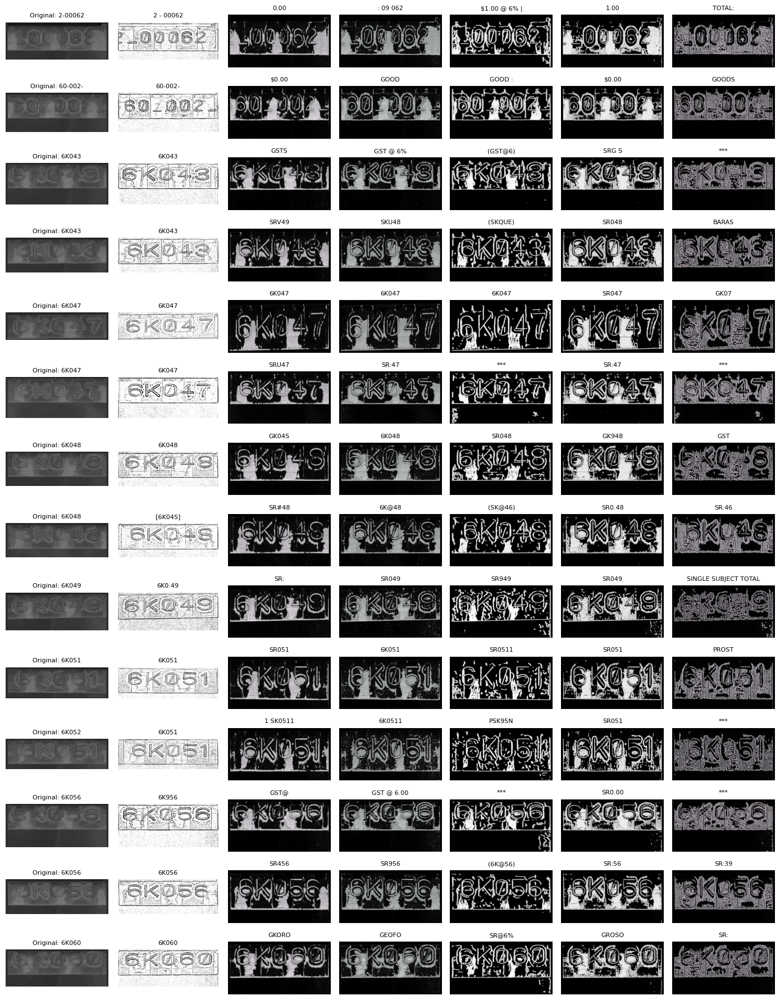

In [71]:
fig, axs = plt.subplots(14, 7, figsize=(14, 18))
for i in range(14):
    original_image = Image.open(baseline_normal_dict['image_path'][i]).convert('RGB')
    # baseline
    ag_image = preprocess_function(baseline_normal_dict['image_path'][i], thres_method='ag')
    ag_image = Image.fromarray(ag_image)
    # exp
    synth1k_image = Image.open(synth1k_normal_dict['image_path'][i])
    synth5k_image = Image.open(synth5k_normal_dict['image_path'][i])
    indust_1_image = Image.open(industrial_1_normal_dict['image_path'][i])
    indust_2_image = Image.open(industrial_2_normal_dict['image_path'][i])
    indust_3_image = Image.open(attgan_normal_dict['image_path'][i])

    axs[i, 0].imshow(original_image)
    axs[i, 0].axis('off')  # Turn off axis labels
    axs[i, 0].set_title(f"Original: {baseline_normal_dict['true_text'][i]}", fontsize=8)
    
    axs[i, 1].imshow(ag_image, cmap='gray')
    axs[i, 1].axis('off')  # Turn off axis labels
    axs[i, 1].set_title(baseline_normal_dict['predicted_text'][i], fontsize=8)

    axs[i, 2].imshow(synth1k_image)
    axs[i, 2].axis('off')  # Turn off axis labels
    axs[i, 2].set_title(synth1k_normal_dict['predicted_text'][i], fontsize=8)

    axs[i, 3].imshow(synth5k_image)
    axs[i, 3].axis('off')  # Turn off axis labels
    axs[i, 3].set_title(synth5k_normal_dict['predicted_text'][i], fontsize=8)

    axs[i, 4].imshow(indust_1_image)
    axs[i, 4].axis('off')  # Turn off axis labels
    axs[i, 4].set_title(industrial_1_normal_dict['predicted_text'][i], fontsize=8)

    axs[i, 5].imshow(indust_2_image)
    axs[i, 5].axis('off')  # Turn off axis labels
    axs[i, 5].set_title(industrial_2_normal_dict['predicted_text'][i], fontsize=8)

    axs[i, 6].imshow(indust_3_image)
    axs[i, 6].axis('off')  # Turn off axis labels
    axs[i, 6].set_title(attgan_normal_dict['predicted_text'][i], fontsize=8)

# Adjust spacing between subplots and show the plot
plt.tight_layout()
fig.patch.set_alpha(0.0)
fig.savefig("./results/normal.png", format='png', dpi=300)
plt.show()

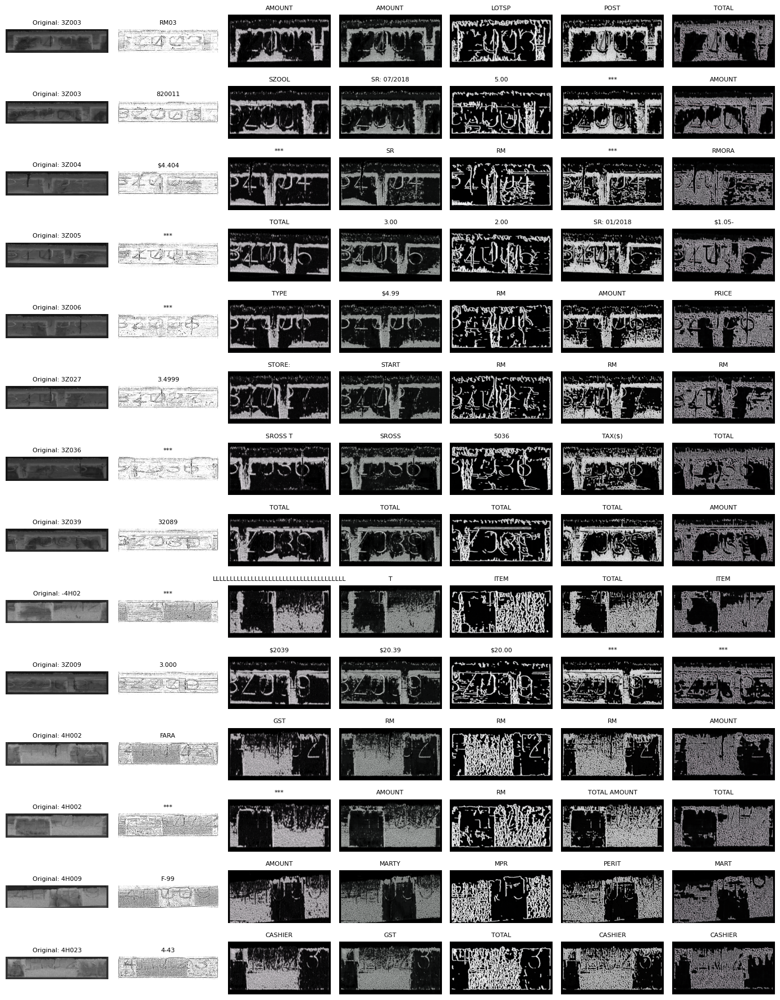

In [72]:
fig, axs = plt.subplots(14, 7, figsize=(14, 18))
for i in range(14):
    original_image = Image.open(baseline_hard_dict['image_path'][i]).convert('RGB')
    # baseline
    ag_image = preprocess_function(baseline_hard_dict['image_path'][i], thres_method='ag')
    ag_image = Image.fromarray(ag_image)
    # exp
    synth1k_image = Image.open(synth1k_hard_dict['image_path'][i])
    synth5k_image = Image.open(synth5k_hard_dict['image_path'][i])
    indust_1_image = Image.open(industrial_1_hard_dict['image_path'][i])
    indust_2_image = Image.open(industrial_2_hard_dict['image_path'][i])
    indust_3_image = Image.open(attgan_hard_dict['image_path'][i])

    axs[i, 0].imshow(original_image)
    axs[i, 0].axis('off')  # Turn off axis labels
    axs[i, 0].set_title(f"Original: {baseline_hard_dict['true_text'][i]}", fontsize=8)
    
    axs[i, 1].imshow(ag_image, cmap='gray')
    axs[i, 1].axis('off')  # Turn off axis labels
    axs[i, 1].set_title(baseline_hard_dict['predicted_text'][i], fontsize=8)

    axs[i, 2].imshow(synth1k_image)
    axs[i, 2].axis('off')  # Turn off axis labels
    axs[i, 2].set_title(synth1k_hard_dict['predicted_text'][i], fontsize=8)

    axs[i, 3].imshow(synth5k_image)
    axs[i, 3].axis('off')  # Turn off axis labels
    axs[i, 3].set_title(synth5k_hard_dict['predicted_text'][i], fontsize=8)

    axs[i, 4].imshow(indust_1_image)
    axs[i, 4].axis('off')  # Turn off axis labels
    axs[i, 4].set_title(industrial_1_hard_dict['predicted_text'][i], fontsize=8)

    axs[i, 5].imshow(indust_2_image)
    axs[i, 5].axis('off')  # Turn off axis labels
    axs[i, 5].set_title(industrial_2_hard_dict['predicted_text'][i], fontsize=8)

    axs[i, 6].imshow(indust_3_image)
    axs[i, 6].axis('off')  # Turn off axis labels
    axs[i, 6].set_title(attgan_hard_dict['predicted_text'][i], fontsize=8)

# Adjust spacing between subplots and show the plot
plt.tight_layout()
fig.patch.set_alpha(0.0)
fig.savefig("./results/hard.png", format='png', dpi=300)
plt.show()

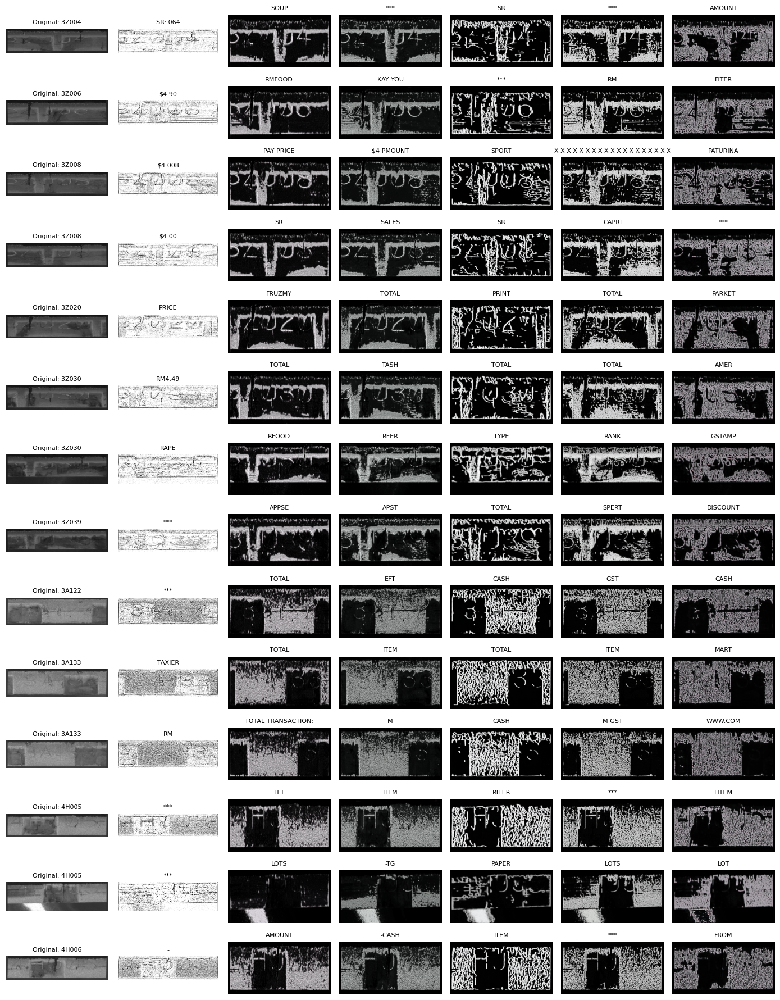

In [74]:
fig, axs = plt.subplots(14, 7, figsize=(14, 18))
for i in range(14):
    original_image = Image.open(baseline_extreme_dict['image_path'][i]).convert('RGB')
    # baseline
    ag_image = preprocess_function(baseline_extreme_dict['image_path'][i], thres_method='ag')
    ag_image = Image.fromarray(ag_image)
    # exp
    synth1k_image = Image.open(synth1k_extreme_dict['image_path'][i])
    synth5k_image = Image.open(synth5k_extreme_dict['image_path'][i])
    indust_1_image = Image.open(industrial_1_extreme_dict['image_path'][i])
    indust_2_image = Image.open(industrial_2_extreme_dict['image_path'][i])
    indust_3_image = Image.open(attgan_extreme_dict['image_path'][i])

    axs[i, 0].imshow(original_image)
    axs[i, 0].axis('off')  # Turn off axis labels
    axs[i, 0].set_title(f"Original: {baseline_extreme_dict['true_text'][i]}", fontsize=8)
    
    axs[i, 1].imshow(ag_image, cmap='gray')
    axs[i, 1].axis('off')  # Turn off axis labels
    axs[i, 1].set_title(baseline_extreme_dict['predicted_text'][i], fontsize=8)

    axs[i, 2].imshow(synth1k_image)
    axs[i, 2].axis('off')  # Turn off axis labels
    axs[i, 2].set_title(synth1k_extreme_dict['predicted_text'][i], fontsize=8)

    axs[i, 3].imshow(synth5k_image)
    axs[i, 3].axis('off')  # Turn off axis labels
    axs[i, 3].set_title(synth5k_extreme_dict['predicted_text'][i], fontsize=8)

    axs[i, 4].imshow(indust_1_image)
    axs[i, 4].axis('off')  # Turn off axis labels
    axs[i, 4].set_title(industrial_1_extreme_dict['predicted_text'][i], fontsize=8)

    axs[i, 5].imshow(indust_2_image)
    axs[i, 5].axis('off')  # Turn off axis labels
    axs[i, 5].set_title(industrial_2_extreme_dict['predicted_text'][i], fontsize=8)

    axs[i, 6].imshow(indust_3_image)
    axs[i, 6].axis('off')  # Turn off axis labels
    axs[i, 6].set_title(attgan_extreme_dict['predicted_text'][i], fontsize=8)

# Adjust spacing between subplots and show the plot
plt.tight_layout()
fig.patch.set_alpha(0.0)
fig.savefig("./results/extreme.png", format='png', dpi=300)
plt.show()

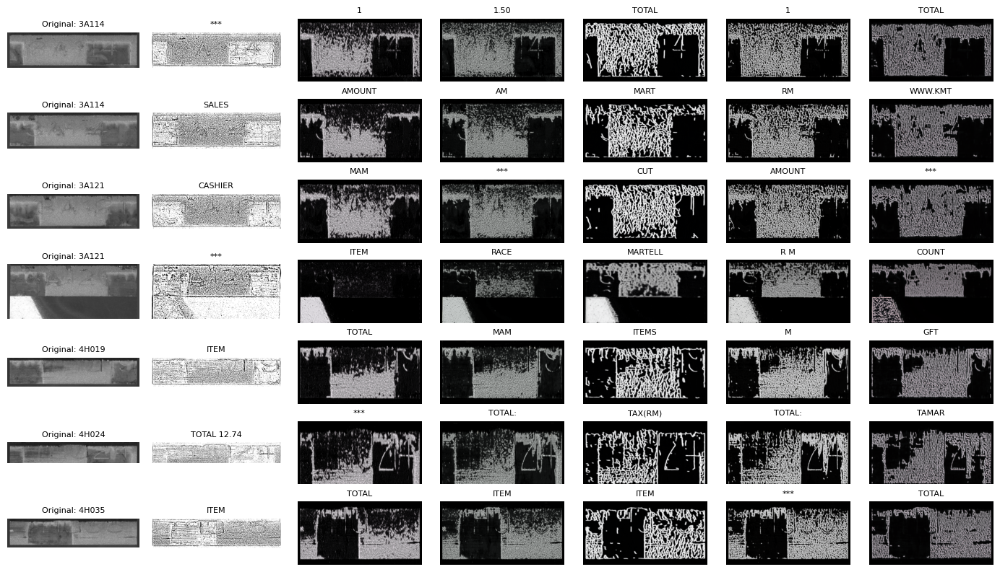

In [75]:
fig, axs = plt.subplots(7, 7, figsize=(14, 8))
for i in range(7):
    original_image = Image.open(baseline_unreadable_dict['image_path'][i]).convert('RGB')
    # baseline
    ag_image = preprocess_function(baseline_unreadable_dict['image_path'][i], thres_method='ag')
    ag_image = Image.fromarray(ag_image)
    # exp
    synth1k_image = Image.open(synth1k_unreadable_dict['image_path'][i])
    synth5k_image = Image.open(synth5k_unreadable_dict['image_path'][i])
    indust_1_image = Image.open(industrial_1_unreadable_dict['image_path'][i])
    indust_2_image = Image.open(industrial_2_unreadable_dict['image_path'][i])
    indust_3_image = Image.open(attgan_unreadable_dict['image_path'][i])

    axs[i, 0].imshow(original_image)
    axs[i, 0].axis('off')  # Turn off axis labels
    axs[i, 0].set_title(f"Original: {baseline_unreadable_dict['true_text'][i]}", fontsize=8)
    
    axs[i, 1].imshow(ag_image, cmap='gray')
    axs[i, 1].axis('off')  # Turn off axis labels
    axs[i, 1].set_title(baseline_unreadable_dict['predicted_text'][i], fontsize=8)

    axs[i, 2].imshow(synth1k_image)
    axs[i, 2].axis('off')  # Turn off axis labels
    axs[i, 2].set_title(synth1k_unreadable_dict['predicted_text'][i], fontsize=8)

    axs[i, 3].imshow(synth5k_image)
    axs[i, 3].axis('off')  # Turn off axis labels
    axs[i, 3].set_title(synth5k_unreadable_dict['predicted_text'][i], fontsize=8)

    axs[i, 4].imshow(indust_1_image)
    axs[i, 4].axis('off')  # Turn off axis labels
    axs[i, 4].set_title(industrial_1_unreadable_dict['predicted_text'][i], fontsize=8)

    axs[i, 5].imshow(indust_2_image)
    axs[i, 5].axis('off')  # Turn off axis labels
    axs[i, 5].set_title(industrial_2_unreadable_dict['predicted_text'][i], fontsize=8)

    axs[i, 6].imshow(indust_3_image)
    axs[i, 6].axis('off')  # Turn off axis labels
    axs[i, 6].set_title(attgan_unreadable_dict['predicted_text'][i], fontsize=8)

# Adjust spacing between subplots and show the plot
plt.tight_layout()
fig.patch.set_alpha(0.0)
fig.savefig("./results/unreadable.png", format='png', dpi=300)
plt.show()

### Accuracy line plot

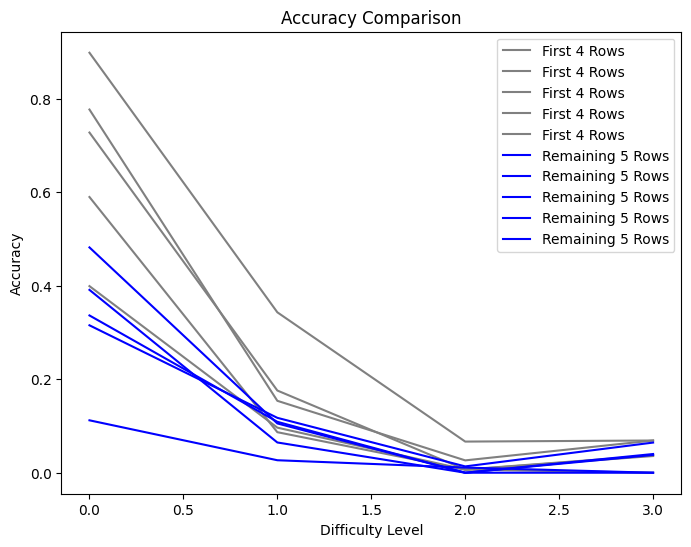

In [104]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming you have a list of arrays with shape (9, 4)
list_of_arrays = [[0.3991,0.0964, 0.0068, 0.0],
                 [0.8983, 0.3431, 0.0666, 0.0689],
                 [0.7276, 0.1758, 0.0068, 0.0370],
                 [0.7768, 0.1538, 0.0264, 0.0689],
                 [0.5897, 0.0867, 0.0064, 0.0357],
                 [0.3364, 0.1089, 0.0, 0.038],
                 [0.4819, 0.1054, 0.0, 0.04],
                 [0.3153, 0.1174, 0.0135, 0.0645],
                 [0.3911, 0.0647, 0.0, 0.0],
                 [0.1121, 0.0267, 0.011, 0.0],]

# Create a figure and axes for the plot
fig, ax = plt.subplots(figsize=(8, 6))

# Plot the first 4 rows in gray color
for row in list_of_arrays[:5]:
    ax.plot(row, color='gray', label='First 4 Rows')

# Plot the remaining 5 rows in blue color
for row in list_of_arrays[5:]:
    ax.plot(row, color='blue', label='Remaining 5 Rows')

# Customize the plot (labels, legend, etc.)
ax.set_xlabel('Difficulty Level')
ax.set_ylabel('Accuracy')
ax.set_title('Accuracy Comparison')
ax.legend()

# Show the plot
plt.show()

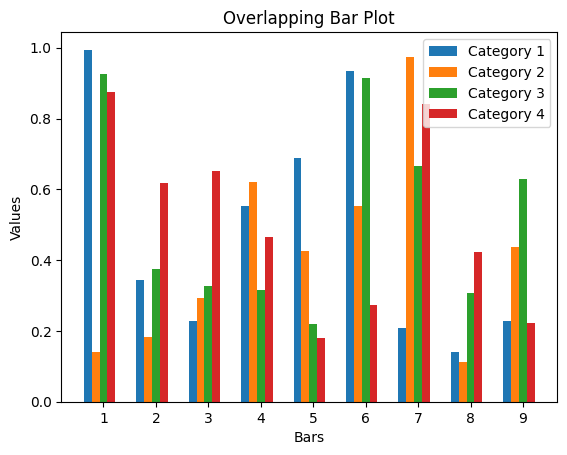

In [107]:
import matplotlib.pyplot as plt
import numpy as np

# Generate random data for 4 categories, each with 9 values
categories = ['Category 1', 'Category 2', 'Category 3', 'Category 4']
values = np.random.rand(9, 4)

# Create a figure and axes for the plot
fig, ax = plt.subplots()

# Define the positions of the bars for each category
positions = np.arange(1, 10)

# Plot the bars for each category
for i, category in enumerate(categories):
    ax.bar(positions + i*0.15, values[:, i], width=0.15, label=category)

# Set labels and title
ax.set_xlabel('Bars')
ax.set_ylabel('Values')
ax.set_title('Overlapping Bar Plot')
ax.set_xticks(positions + 0.3)
ax.set_xticklabels([str(i) for i in range(1, 10)])

# Add legend
ax.legend()

# Show the plot
plt.show()